# Potato Leaf Disease Classification

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/7948ada9-eabc-4cb7-a579-b73e938eb716___RS_HL 4185.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/f5bd2732-197b-4d8e-bb50-a4966dc416f5___RS_HL 1840.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/5a3fc4bb-a78c-4276-8934-f0b037ffb860___RS_HL 5412.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/875d6ded-5f01-495c-a945-ad2e17f87f91___RS_HL 1848.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/4ae82355-6885-40e7-9807-dabe46ed3441___RS_HL 5410.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/f30983c0-6e20-43cc-8672-4622ca34c830___RS_HL 1949.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/5df30492-0b54-474d-8883-bba9474ca88f___RS_HL 1801.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/2e0b8b4b-e900-408b-b760-730690bbd382___RS_HL 1901.JPG
/kaggle/input/potato-dataset/PlantVillage/Potato___healthy/774875d3-438a-4305-afe2-7d59e2925dc4_

# Neural Network Model with TensorFlow and Keras for Classification

* This code snippet demonstrates the construction of a neural network model for classification tasks using TensorFlow and its high-level API Keras. The model is designed to learn patterns in data and make predictions on unseen instances. Additionally, the matplotlib library is utilized to visualize training performance.



In [ ]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt

In [ ]:
BATCH_SIZE=32
IMAGE_SIZE=224
CHANNELS=3
EPOCHS=50

# Loading Image Dataset for Training
* The code snippet uses tf.keras.preprocessing.image_dataset_from_directory() function to load the image dataset for training. This function is part of TensorFlow's Keras utilities for preprocessing image data. It facilitates loading images directly from a directory structure, where each subdirectory represents a class label.



In [ ]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
    "/kaggle/input/potato-dataset/PlantVillage",
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


# Retrieving Class Names from the Dataset
* The code snippet retrieves the class names from the previously loaded dataset. This dataset contains image data for a classification task, where each subdirectory in the specified directory represents a class label.



In [ ]:
class_names=dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Data Visualization

In [ ]:
import os

Potato___Early_blight_dir = '/kaggle/input/potato-dataset/PlantVillage/Potato___Early_blight'
Potato___Late_blight_dir = '/kaggle/input/potato-dataset/PlantVillage/Potato___Late_blight'
Potato___healthy_dir = '/kaggle/input/potato-dataset/PlantVillage/Potato___healthy'

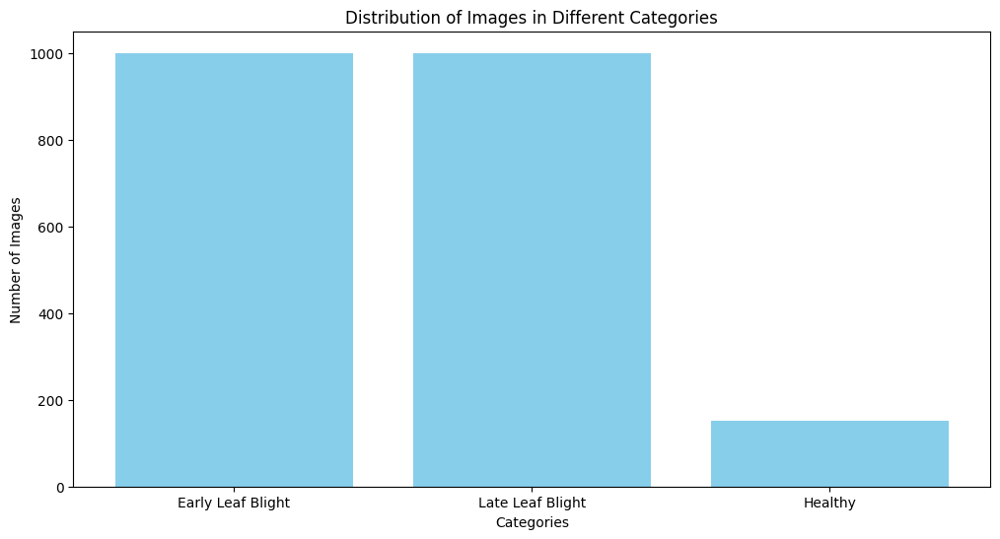

In [ ]:
import matplotlib.pyplot as plt

# Define the categories and corresponding counts
categories = ['Early Leaf Blight','Late Leaf Blight','Healthy']
counts = [len(os.listdir(Potato___Early_blight_dir)), len(os.listdir(Potato___Late_blight_dir)), len(os.listdir(Potato___healthy_dir))]

# Create a bar plot to visualize the distribution of images
plt.figure(figsize=(12, 6))
plt.bar(categories, counts, color='skyblue')
plt.xlabel('Categories')
plt.ylabel('Number of Images')
plt.title('Distribution of Images in Different Categories')
plt.show()

# Visualizing Sample Images from the Dataset
* The code snippet visualizes a sample batch of images along with their corresponding labels from the loaded dataset. Matplotlib is used to create a grid of images with their respective class labels.


(32, 224, 224, 3)
[1 0 1 1 0 1 1 1 0 1 0 1 0 1 1 0 1 0 0 1 0 2 1 0 0 0 0 2 0 1 1 1]


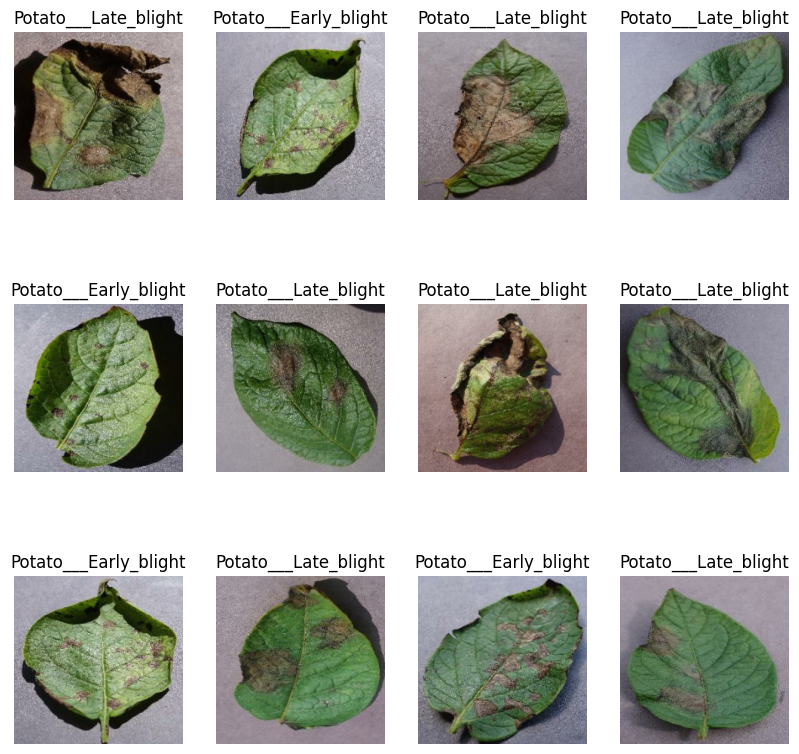

In [ ]:
plt.figure(figsize=(10,10))
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())
    for i in range(12):
        ax=plt.subplot(3,4,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

# Function to Split Dataset into Training and Validation Sets
*  The provided function get_dataset_partitions_tf() splits a given dataset into training and validation sets according to specified proportions. It also supports shuffling the dataset before splitting.



In [ ]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.2, shuffle=True, shuffle_size=10000):
    assert(train_split+val_split)==1

    ds_size=len(ds)

    if shuffle:
        ds=ds.shuffle(shuffle_size, seed=12)

    train_size=int(train_split*ds_size)
    val_size=int(val_split*ds_size)

    train_ds=ds.take(train_size)
    val_ds=ds.skip(train_size).take(val_size)

    return train_ds, val_ds

In [ ]:
train_ds, val_ds =get_dataset_partitions_tf(dataset)

In [ ]:
len(train_ds)

54

In [ ]:
len(val_ds)

13

# Data Augmentation

In [ ]:
train_ds= train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds= val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch[0].numpy()/255)

[[[0.79495794 0.78319323 0.8106442 ]
  [0.79793924 0.78617454 0.8136255 ]
  [0.7929172  0.7811525  0.80860347]
  ...
  [0.7553621  0.7514405  0.7828131 ]
  [0.7512005  0.7472789  0.7786515 ]
  [0.7436573  0.7397357  0.77110827]]

 [[0.7718288  0.76006407 0.78751504]
  [0.7790716  0.7673069  0.7947579 ]
  [0.78715485 0.77539015 0.8028411 ]
  ...
  [0.76502603 0.76110446 0.792477  ]
  [0.76442575 0.7605042  0.79187673]
  [0.76598644 0.7620649  0.7934374 ]]

 [[0.75108045 0.73931575 0.7667667 ]
  [0.7669668  0.7552021  0.7826531 ]
  [0.78319323 0.7714285  0.7988795 ]
  ...
  [0.7449178  0.74099624 0.7723688 ]
  [0.7395158  0.7355942  0.76696676]
  [0.74649876 0.7425772  0.77394974]]

 ...

 [[0.6097834  0.5980187  0.6254697 ]
  [0.59917986 0.58741516 0.61486614]
  [0.59425765 0.58249295 0.6099439 ]
  ...
  [0.6002996  0.5885349  0.63167214]
  [0.56308484 0.55132014 0.5944574 ]
  [0.54779863 0.5360339  0.5791712 ]]

 [[0.5928371  0.5810724  0.60852337]
  [0.64167696 0.62991226 0.65736324]


In [ ]:
! pip install preprocessing

In [ ]:
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.Rescaling(1./255),
])

In [ ]:
data_augmentation=tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
])

In [ ]:
n_classes=3

# Our own Convolutional Neural Network (CNN) for Image Classification
* The provided code presents an extended CNN model using TensorFlow and Keras for image classification tasks.



In [ ]:
input_shape=(BATCH_SIZE, IMAGE_SIZE,IMAGE_SIZE,CHANNELS)
n_classes=3

model_1= models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(64,activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])
model_1.build(input_shape=input_shape)

In [ ]:
model_1.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (32, 224, 224, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (32, 224, 224, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (32, 222, 222, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (32, 111, 111, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (32, 109, 109, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (32, 54, 54, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (32, 52, 52, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (32, 26, 26, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (32, 24, 24, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (32, 12, 12, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (32, 10, 10, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (32, 5, 5, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (32, 3, 3, 64)         │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (32, 1, 1, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (32, 64)               │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (32, 64)               │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 3)                │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 171,459 (669.76 KB)

 Trainable params: 171,459 (669.76 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_1.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
history=model_1.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 16s 87ms/step - accuracy: 0.4633 - loss: 0.9445 - val_accuracy: 0.6250 - val_loss: 0.8428
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.6046 - loss: 0.7915 - val_accuracy: 0.6923 - val_loss: 0.7937
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.7481 - loss: 0.5830 - val_accuracy: 0.8173 - val_loss: 0.4090
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8152 - loss: 0.4334 - val_accuracy: 0.8870 - val_loss: 0.2752
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.8797 - loss: 0.3230 - val_accuracy: 0.9231 - val_loss: 0.2514
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.9052 - loss: 0.2605 - val_accuracy: 0.9327 - val_loss: 0.2211
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.9184 - loss: 0.2178 - val_accuracy: 0.8870 - val_loss: 0.2667
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy: 0.9180 - loss: 0.1831 - val_accuracy: 0.8582 - 

In [ ]:
scores=model_1.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9985 - loss: 0.0243


In [ ]:
scores

[0.03673547878861427, 0.9975961446762085]

In [ ]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

# Training History Metrics Extraction
* Accuracy (acc): Accuracy is a measure of the proportion of correctly classified instances out of the total instances. It indicates the model's overall performance on the training data.
* Validation Accuracy (val_acc): Validation accuracy represents the model's performance on a separate validation dataset, providing insights into its generalization capability.
* Loss (loss): Loss is a measure of the model's performance during training. It quantifies the difference between predicted and actual values.
* Validation Loss (val_loss): Validation loss measures the performance of the model on the validation dataset. It indicates how well the model generalizes to unseen data.


In [ ]:
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

In [ ]:
history.history['accuracy']

[0.48900464177131653,
 0.6487268805503845,
 0.7719907164573669,
 0.8234953880310059,
 0.8715277910232544,
 0.9097222089767456,
 0.9241898059844971,
 0.9137731194496155,
 0.9438657164573669,
 0.9467592835426331,
 0.9386574029922485,
 0.9629629850387573,
 0.9681712985038757,
 0.9681712985038757,
 0.9722222089767456,
 0.9693287014961243,
 0.9797453880310059,
 0.9699074029922485,
 0.9768518805503845,
 0.9658564925193787,
 0.9832175970077515,
 0.9895833134651184,
 0.9797453880310059,
 0.9913194179534912,
 0.9907407164573669,
 0.9890046119689941,
 0.9866898059844971,
 0.9878472089767456,
 0.9785879850387573,
 0.9826388955116272,
 0.9791666865348816,
 0.9947916865348816,
 0.9728009104728699,
 0.9837962985038757,
 0.9890046119689941,
 0.9901620149612427,
 0.9791666865348816,
 0.9837962985038757,
 0.9913194179534912,
 0.9884259104728699,
 0.9965277910232544,
 0.9936342835426331,
 0.9918981194496155,
 0.9884259104728699,
 0.9930555820465088,
 0.9895833134651184,
 0.9953703880310059,
 0.996527791

# Training History Visualization
* The provided code visualizes the training history metrics, including accuracy and loss, over the epochs of model training. This visualization aids in understanding the model's performance and behavior during training and validation phases.



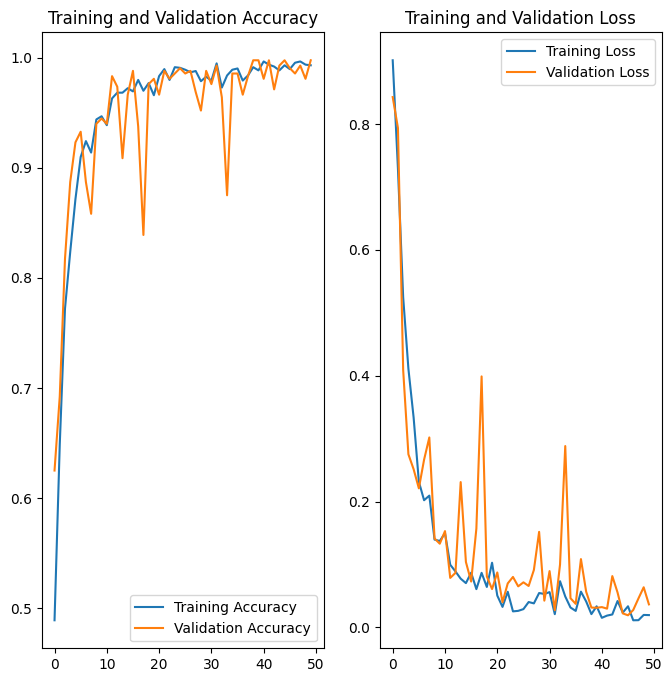

In [ ]:
EPOCHS=50
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


# Prediction of Image Labels from Validation Dataset
* This code segment demonstrates the process of predicting labels for images from a validation dataset using a pre-trained convolutional neural network (CNN) model (model_1). The prediction results are then compared with the actual labels to assess the model's performance.



First image to predict
Actual Label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
Predicted Label: Potato___Late_blight


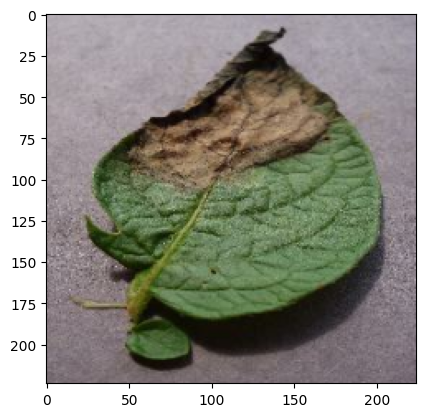

In [ ]:
import numpy as np
for images_batch, labels_batch in val_ds.take(1):
  first_image=images_batch[0].numpy().astype("uint8")
  print("First image to predict")
  plt.imshow(first_image)
  print("Actual Label:",class_names[labels_batch[0].numpy()])

  batch_prediction = model_1.predict(images_batch)
  print("Predicted Label:",class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step


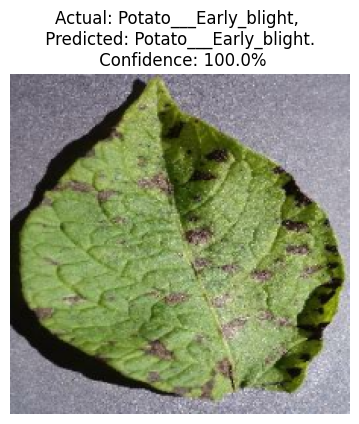

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


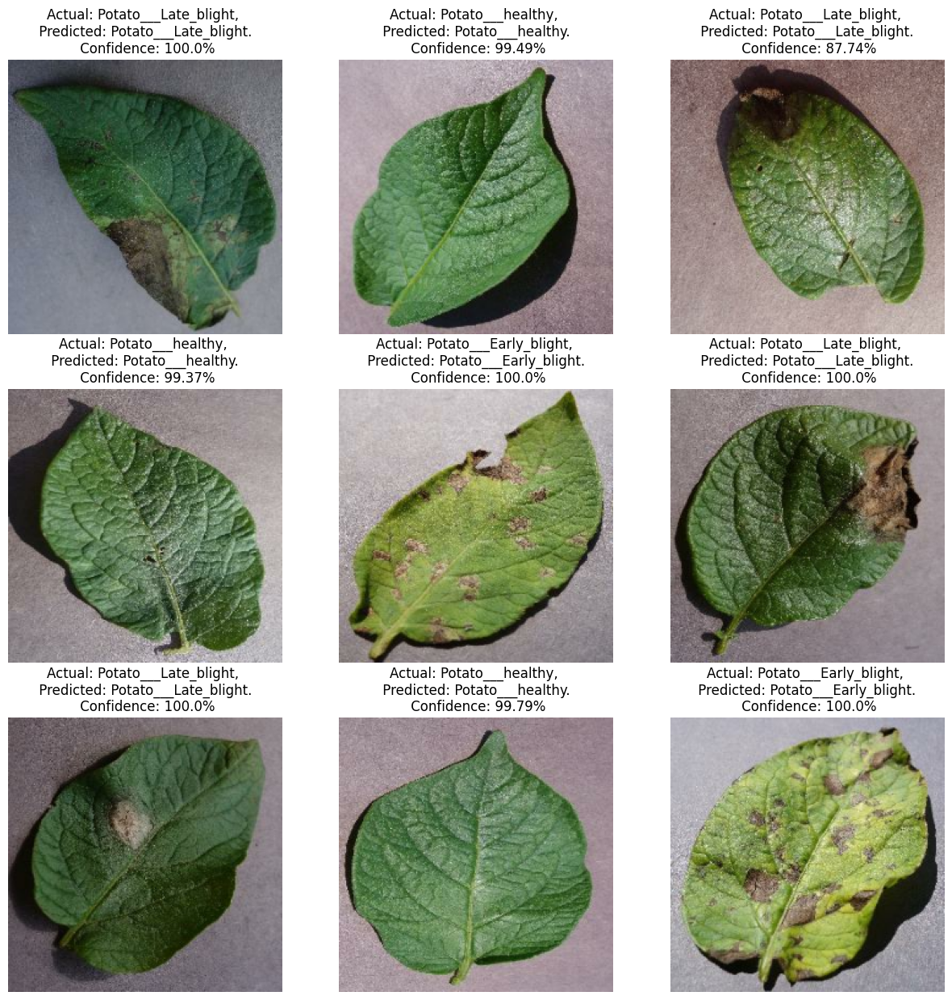

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# Saving the TensorFlow Model

In [ ]:
from tensorflow.keras.models import save_model

# Save the TensorFlow model in .h5 format

# With this line
model_1.save('/kaggle/working/model_potato_50epochs_99%acc.keras')


The provided code segment visualizes a subset of images from the validation dataset along with their predicted classes and confidence scores using the model_1

# Evaluating Model Predictions on Validation Dataset
The provided code segment aims to evaluate the predictions made by a trained model (model_1) on the validation dataset (val_ds). It stores the true labels (y_true) and predicted labels (y_pred) for later analysis.

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = model_1.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


# Evaluation Metrics Calculation
The provided code segment calculates various evaluation metrics to assess the performance of a classification model on the validation dataset.

Metrics Calculated:
* Accuracy: The proportion of correctly classified instances among all instances.
* Precision: The ability of the model to correctly classify positive instances among all instances it classified as positive.
* Recall: The ability of the model to correctly identify positive instances among all actual positive instances.
* F1 Score: The harmonic mean of precision and recall, providing a balanced measure between the two.


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')  # (accuracy = (TP+TN)/(TP+FP+TN+FN))
print(f'Precision: {precision}')  # (precision = TP/(TP+FP))
print(f'Recall: {recall}')  # (recall = TP/(TP+FN))
print(f'F1 Score: {f1}')  # (f1 score = 2/((1/Precision)+(1/Recall)))

Accuracy: 0.9975961538461539
Precision: 0.9976089402618658
Recall: 0.9975961538461539
F1 Score: 0.9975828942746751


# Visualization of Confusion Matrix
*  The provided code segment visualizes the confusion matrix, which is a useful tool for understanding the performance of a classification model by analyzing the patterns of true and predicted labels.



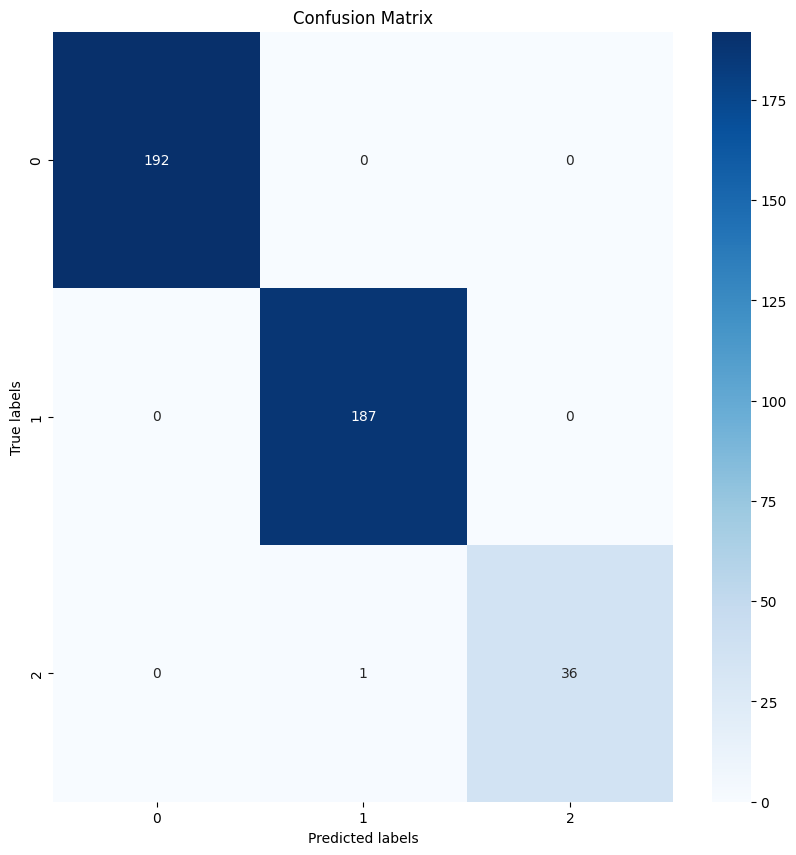

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# Saving the TensorFlow Model

In [ ]:
from tensorflow.keras.models import save_model

# Save the TensorFlow model in .h5 format

# With this line
model_1.save('/kaggle/working/model_potato_50epochs_99%acc_h5.h5')

# CNN Architecture Specification of the Base Research Paper
Layers:
Convolutional Layers:

* Number of Filters (Channels): 64, 128, 256, 512, 512
Kernel Size: 3x3 (Assumed same for all convolutional layers)

* Max Pooling Layers: Pooling Size: 2x2
Stride: Default (Assumed same for all max pooling layers)

* Fully Connected (Dense) Layers: Number of Neurons: Varies, with a final layer having 4096 neurons.
The value x before (x, 4096) needs to be specified.

In [ ]:
#Proposed Model in Research Paper
# activation units=64,128,256,512,512,4096,4096,1000
# kernel= 3,3
# max pooling =2,2

In [ ]:
input_shape=(224,224,3)

# Paper-Based CNN Model Architecture
The provided code defines a convolutional neural network (CNN) model architecture inspired by a paper.

In [ ]:
from tensorflow.keras import Input

model_paper = models.Sequential([
    Input(shape=input_shape),
    resize_and_rescale,
    data_augmentation,
    # conv1
    layers.Conv2D(64, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv2
    layers.Conv2D(128, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv3
    layers.Conv2D(256, kernel_size=(3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv4
    layers.Conv2D(512, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    #conv5
    layers.Conv2D(512, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),

    layers.Flatten(),
    layers.Dense(4096, activation='relu'),
    layers.Dense(4096, activation='relu'),
    layers.Dense(1000, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

In [ ]:
model_paper.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 222, 222, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 109, 109, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 54, 54, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 52, 52, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 26, 26, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 24, 24, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 12, 12, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 10, 10, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 5, 5, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 4096)           │    52,432,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 1000)           │     4,097,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 3)              │         3,003 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 77,224,995 (294.59 MB)

 Trainable params: 77,224,995 (294.59 MB)

 Non-trainable params: 0 (0.00 B)

# Compilation of the Paper-Based CNN Model
The provided code compiles the paper-based convolutional neural network (CNN) model (model_paper) for training.

In [ ]:
model_paper.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

# Training the Paper-Based CNN Model
The provided code snippet conducts the training of the paper-based convolutional neural network (CNN) model (model_paper).

In [ ]:
history_paper=model_paper.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 186ms/step - accuracy: 0.4579 - loss: 1.0663 - val_accuracy: 0.5817 - val_loss: 1.1392
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 183ms/step - accuracy: 0.7025 - loss: 0.7673 - val_accuracy: 0.7524 - val_loss: 0.6356
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 181ms/step - accuracy: 0.8056 - loss: 0.5366 - val_accuracy: 0.8173 - val_loss: 0.5490
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.8537 - loss: 0.4083 - val_accuracy: 0.7933 - val_loss: 0.4602
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.8777 - loss: 0.3287 - val_accuracy: 0.8654 - val_loss: 0.3521
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.8565 - loss: 0.3654 - val_accuracy: 0.8630 - val_loss: 0.3551
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.8747 - loss: 0.3356 - val_accuracy: 0.8245 - val_loss: 0.5662
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.8818 - loss: 0.2805 - val_accu

In [ ]:
scores_paper=model_paper.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9867 - loss: 0.0249


In [ ]:
scores_paper

[0.04349297657608986, 0.9855769276618958]

In [ ]:
history_paper.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_paper.history['accuracy']
val_acc=history_paper.history['val_accuracy']

loss=history_paper.history['loss']
val_loss=history_paper.history['val_loss']

In [ ]:
history_paper.history['accuracy']

[0.49768519401550293,
 0.7303240895271301,
 0.8130787014961243,
 0.8396990895271301,
 0.8663194179534912,
 0.8721064925193787,
 0.8778935074806213,
 0.8831018805503845,
 0.8883101940155029,
 0.8796296119689941,
 0.8831018805503845,
 0.8917824029922485,
 0.9050925970077515,
 0.9108796119689941,
 0.9021990895271301,
 0.9369212985038757,
 0.9380787014961243,
 0.9496527910232544,
 0.9456018805503845,
 0.9375,
 0.9565972089767456,
 0.953125,
 0.9554398059844971,
 0.9369212985038757,
 0.9496527910232544,
 0.9664351940155029,
 0.9571759104728699,
 0.9594907164573669,
 0.9623842835426331,
 0.9594907164573669,
 0.9542824029922485,
 0.9646990895271301,
 0.9652777910232544,
 0.9710648059844971,
 0.9699074029922485,
 0.9756944179534912,
 0.9490740895271301,
 0.9612268805503845,
 0.9658564925193787,
 0.9774305820465088,
 0.9791666865348816,
 0.9699074029922485,
 0.9756944179534912,
 0.9641203880310059,
 0.9606481194496155,
 0.9583333134651184,
 0.9456018805503845,
 0.9710648059844971,
 0.9814814925

# Visualization of Training and Validation Metrics of Base Paper Model
The provided code segment visualizes the training and validation metrics over the epochs of training for the paper-based CNN model.

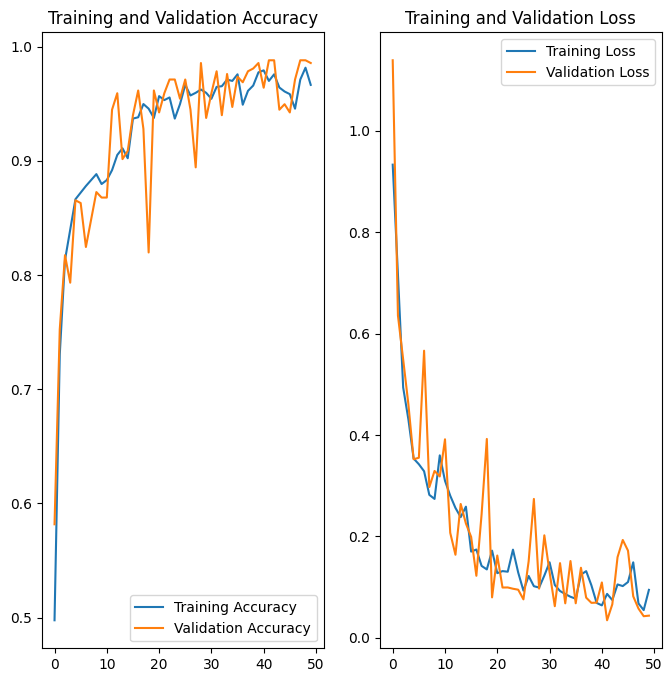

In [ ]:
EPOCHS=50
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


# Prediction of Image Label from Validation Dataset
The provided code segment predicts the label for the first image in the validation dataset (val_ds) using the trained paper-based convolutional neural network (CNN) model (model_paper).

First image to predict
Actual Label: Potato___Early_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
Predicted Label: Potato___Early_blight


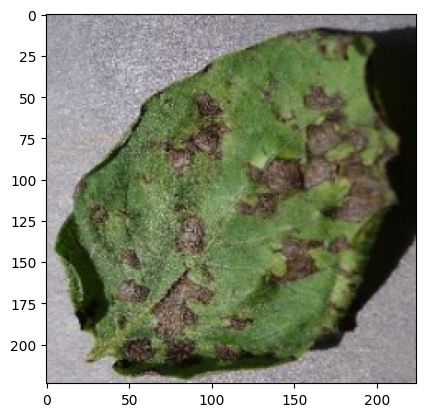

In [ ]:
import numpy as np
for images_batch, labels_batch in val_ds.take(1):
  first_image=images_batch[0].numpy().astype("uint8")
  print("First image to predict")
  plt.imshow(first_image)
  print("Actual Label:",class_names[labels_batch[0].numpy()])

  batch_prediction = model_paper.predict(images_batch)
  print("Predicted Label:",class_names[np.argmax(batch_prediction[0])])

The provided function predict accepts a model and an image as input, performs prediction using the model, and returns the predicted class along with the confidence score.

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

The provided code segment visualizes a subset of images from the validation dataset along with their predicted classes and confidence scores.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 712ms/step


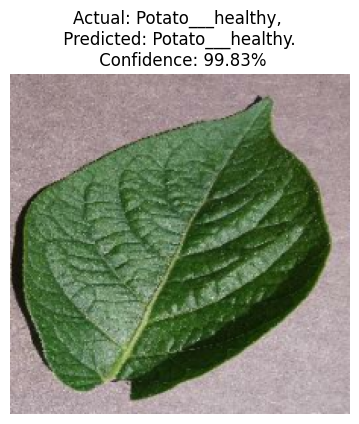

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_paper, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


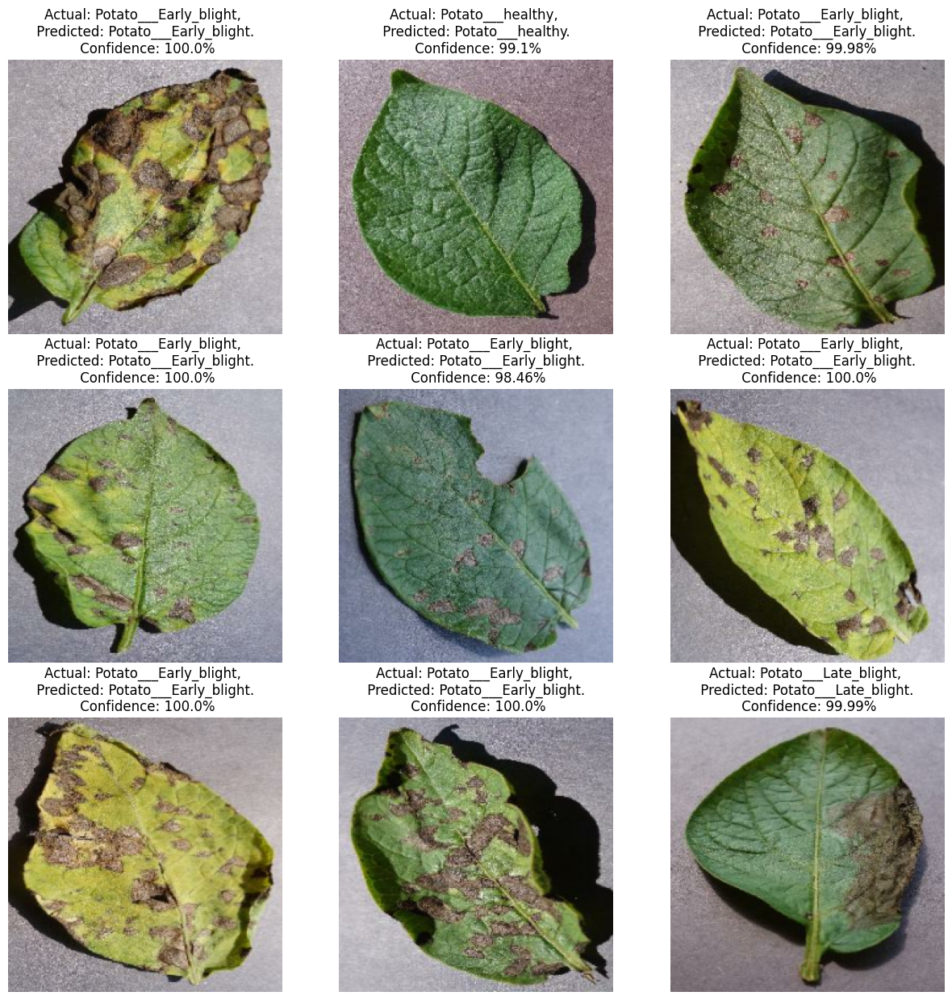

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(model_paper, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

The provided code snippet saves the trained paper-based CNN model (model_paper) in the TensorFlow/Keras format (.keras) at the specified location.

# Saving the Tensorflow model of the base paper

In [ ]:
from tensorflow.keras.models import save_model

# Save the TensorFlow model in .h5 format

# With this line
model_paper.save('/kaggle/working/model_potato_basepaper.keras')


The updated code visualizes a larger subset of images (9 images) from the validation dataset along with their predicted classes and confidence scores.

In [ ]:
# Initialize lists to store the results
y_true = []
y_pred = []

# Iterate over the validation dataset
for images, labels in val_ds:
    # Get the model's predictions
    predictions = model_paper.predict(images)

    # Get the indices of the maximum values along an axis using argmax
    pred_labels = np.argmax(predictions, axis=1)

    # Extend the 'y_true' and 'y_pred' lists
    y_true.extend(labels.numpy())
    y_pred.extend(pred_labels)

# Convert lists to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


# Calculating Classification Metrics

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

Accuracy: 0.9855769230769231
Precision: 0.9855993140924425
Recall: 0.9855769230769231
F1 Score: 0.9855564736839348


# The provided code segment visualizes the confusion matrix using Seaborn's heatmap function.

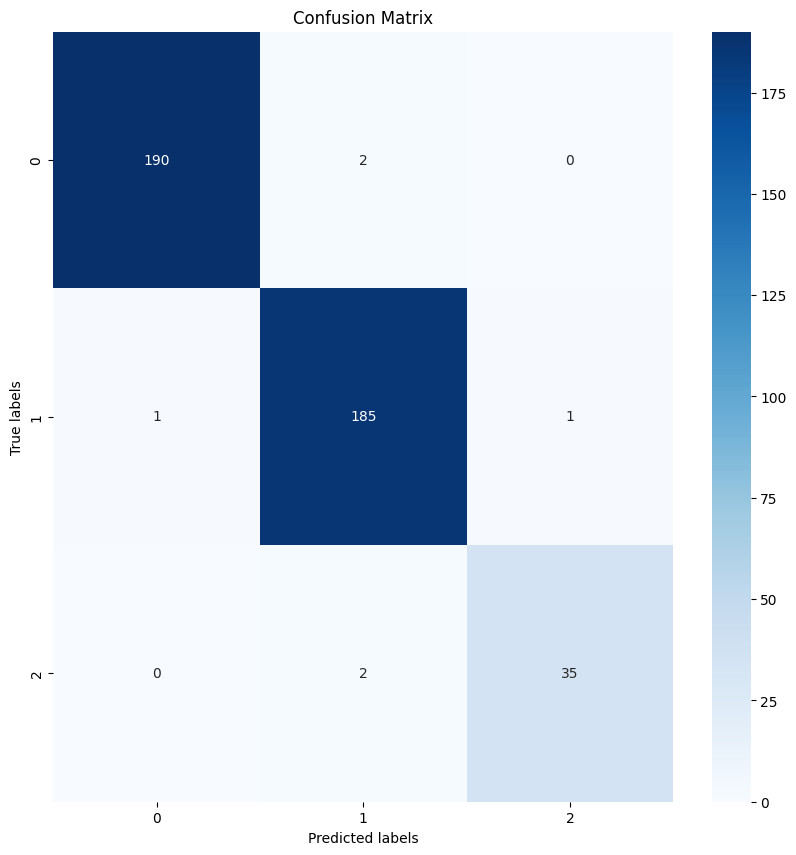

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Assuming y_true and y_pred are defined
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

# Using Explainable AI to explain the predictions of our own CNN model

## Taking an image and predicting it's class using our own CNN Model

First image to predict
Actual Label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Top 3 Predicted Labels: ['Potato___Late_blight', 'Potato___healthy', 'Potato___Early_blight']
Top 3 Predicted Probabilities (%): [100.0, 6.595763379912967e-08, 6.318137124594614e-08]


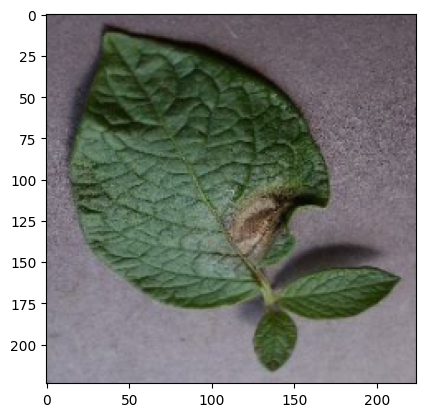

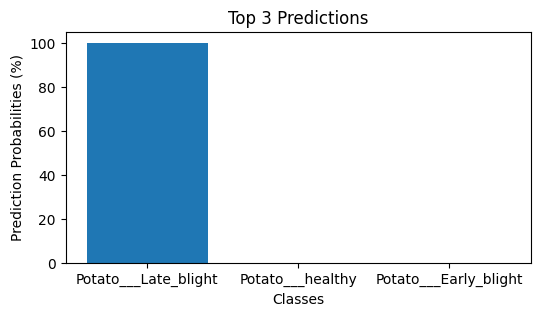

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

for images_batch, labels_batch in val_ds.take(1):
  first_image = images_batch[0].numpy().astype("uint8")
  print("First image to predict")
  plt.imshow(first_image)
  print("Actual Label:", class_names[labels_batch[0].numpy()])

  batch_prediction = model_1.predict(images_batch)
  top_3_pred_indices = np.argsort(batch_prediction[0])[-3:][::-1]
  top_3_pred_labels = [class_names[index] for index in top_3_pred_indices]
  top_3_pred_values = [batch_prediction[0][index] for index in top_3_pred_indices]
  top_3_pred_percentages = [value * 100 for value in top_3_pred_values]
  print("Top 3 Predicted Labels:", top_3_pred_labels)
  print("Top 3 Predicted Probabilities (%):", top_3_pred_percentages)

  # Plotting the top 3 predictions
  plt.figure(figsize=(6, 3))
  plt.bar(top_3_pred_labels, top_3_pred_percentages)
  plt.title('Top 3 Predictions')
  plt.xlabel('Classes')
  plt.ylabel('Prediction Probabilities (%)')
  plt.show()

# Model Explainability with LIME (Local Interpretable Model-Agnostic Explanations)

In [ ]:
!pip install lime

# Setting up Lime for Image Explanation
* This code snippet sets up the environment for utilizing Lime, a library for explaining image predictions, by importing necessary modules and handling the case where Lime is not initially found.

In [ ]:
%load_ext autoreload
%autoreload 2
import os,sys
try:
    import lime
except:
    sys.path.append(os.path.join('..', '..')) # add the current directory
    import lime
from lime import lime_image

In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
%%time
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(images_batch[0].numpy().astype('double'), model_1.predict, top_labels=3, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━

In [ ]:
explanation

In [ ]:
from skimage.segmentation import mark_boundaries

# Superpixel for the top most Prediction

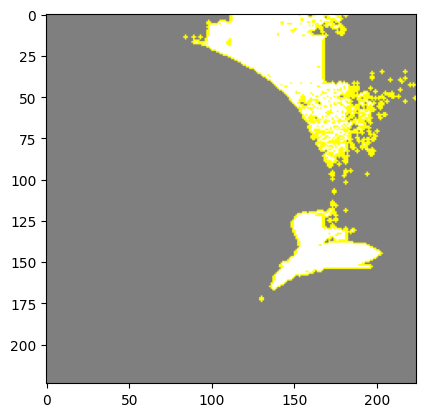

In [ ]:
#here hide_rest is True
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=3, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

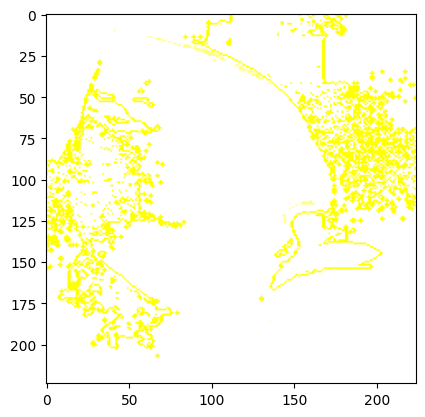

In [ ]:
#here hide_rest is False
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Visualizing 'pros and cons'

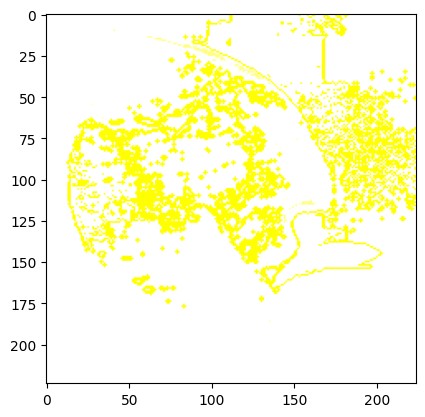

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# pros and cons
* With weight at least 0.1

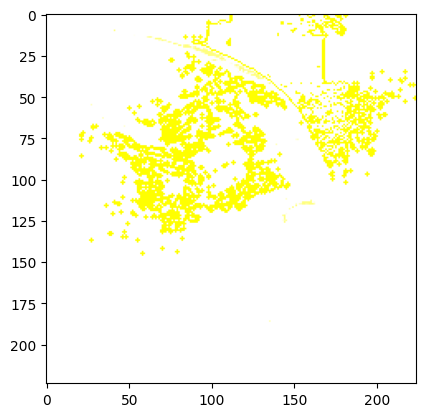

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Explaination Heatmap plot with weights
* Colorbar shows the values of the weights.

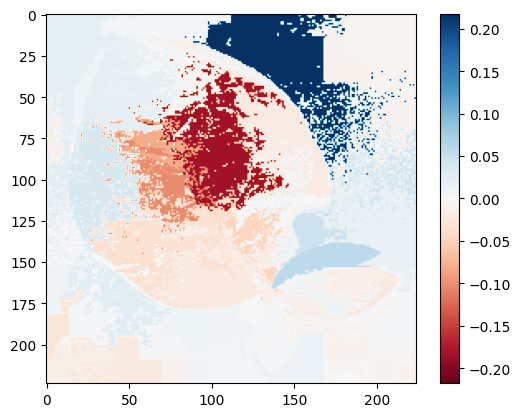

In [ ]:
#Select the same class explained on the figures above.
ind =  explanation.top_labels[0]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

# Second Prediction in the List

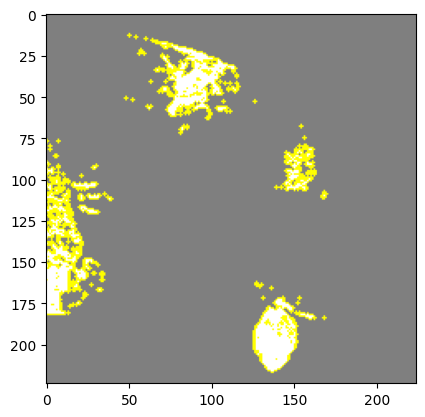

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Rest of the image from the second prediction i.e. top_labels[1]

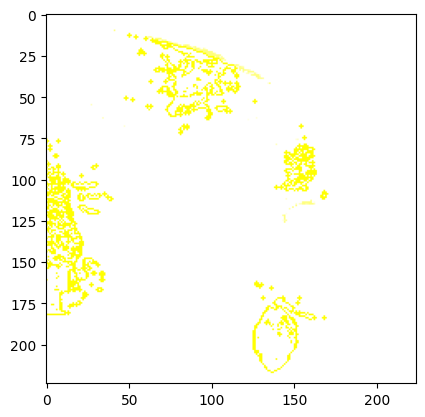

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Visualizing 'pros and cons'

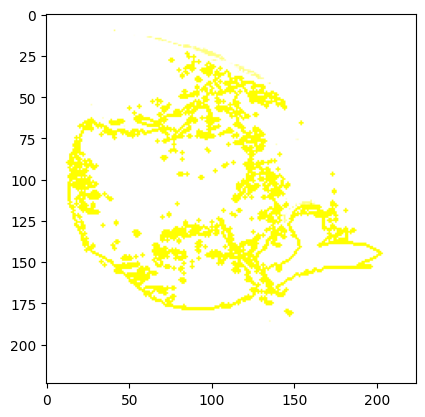

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# pros and cons
* With weight at least 0.1

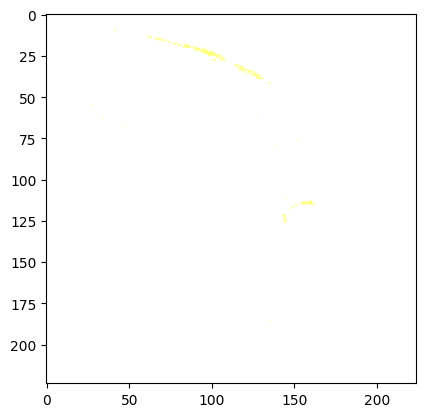

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

# Explaination Heatmap plot with weights
* Colorbar shows the values of the weights.

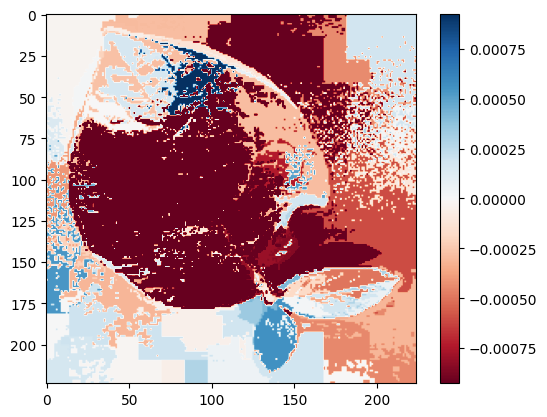

In [ ]:
#Select the same class explained on the figures above.
ind =  explanation.top_labels[1]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()


# 2nd Lime Model

In [ ]:
from lime import lime_image

In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
explanation = explainer.explain_instance(images_batch[0].numpy().astype('double'), model_1.predict,top_labels=3, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

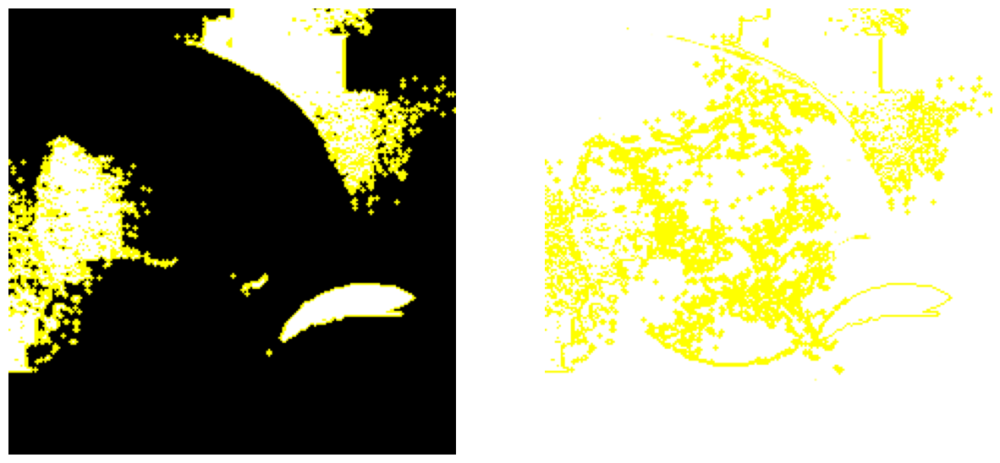

In [ ]:
from skimage.segmentation import mark_boundaries

temp_1, mask_1 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
temp_2, mask_2 = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
ax1.imshow(mark_boundaries(temp_1, mask_1))
ax2.imshow(mark_boundaries(temp_2, mask_2))
ax1.axis('off')
ax2.axis('off')

plt.savefig('mask_default.png')

# Using Pre trained Models

# Pre trained Models to be used :

* ResNet50 Model
* ResNet152 Model
* InceptionV3 Model
* VGG16 Model
* VGG19 Model

In [ ]:
input_shape=(224,224,3)

# ResNet50 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50

# Assuming you have defined IMAGE_SIZE, BATCH_SIZE, and CHANNELS previously

# Load the pre-trained ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224, 3))

# Freeze the weights of the pre-trained layers
for layer in resnet_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(resnet_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(dense_layer_1)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the ResNet base model with your custom head
resnet50_custom_model = models.Model(inputs=resnet_model.input, outputs=output_layer)

# Summary of the model
resnet50_custom_model.summary()

Model: "functional_51"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_33      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_33[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 36,466,691 (139.11 MB)

 Trainable params: 12,878,979 (49.13 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# Compile the model
resnet50_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the ResNet model with early stopping
history_resnet50 = resnet50_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 179ms/step - accuracy: 0.7197 - loss: 5.9331 - val_accuracy: 0.9495 - val_loss: 0.1815
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - accuracy: 0.9594 - loss: 0.1884 - val_accuracy: 0.9663 - val_loss: 0.2045
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 107ms/step - accuracy: 0.9852 - loss: 0.0879 - val_accuracy: 0.9904 - val_loss: 0.0263
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - accuracy: 0.9841 - loss: 0.0790 - val_accuracy: 0.9928 - val_loss: 0.0299
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.9909 - loss: 0.0374 - val_accuracy: 1.0000 - val_loss: 5.7746e-04
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.9861 - loss: 0.1234 - val_accuracy: 0.9880 - val_loss: 0.0624
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.9801 - loss: 0.1505 - val_accuracy: 0.9928 - val_loss: 0.0558
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 109ms/step - accuracy: 0.9927 - loss: 0.0321 - val_accurac

In [ ]:
scores_resnet50=resnet50_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - accuracy: 0.9946 - loss: 0.0252


In [ ]:
scores_resnet50

[0.018140744417905807, 0.995192289352417]

In [ ]:
acc=history_resnet50.history['accuracy']
val_acc=history_resnet50.history['val_accuracy']

loss=history_resnet50.history['loss']
val_loss=history_resnet50.history['val_loss']

In [ ]:
history_resnet50.history['accuracy']

[0.8622685074806213,
 0.9670138955116272,
 0.9878472089767456,
 0.9866898059844971,
 0.9930555820465088,
 0.9791666865348816,
 0.9890046119689941,
 0.9942129850387573]

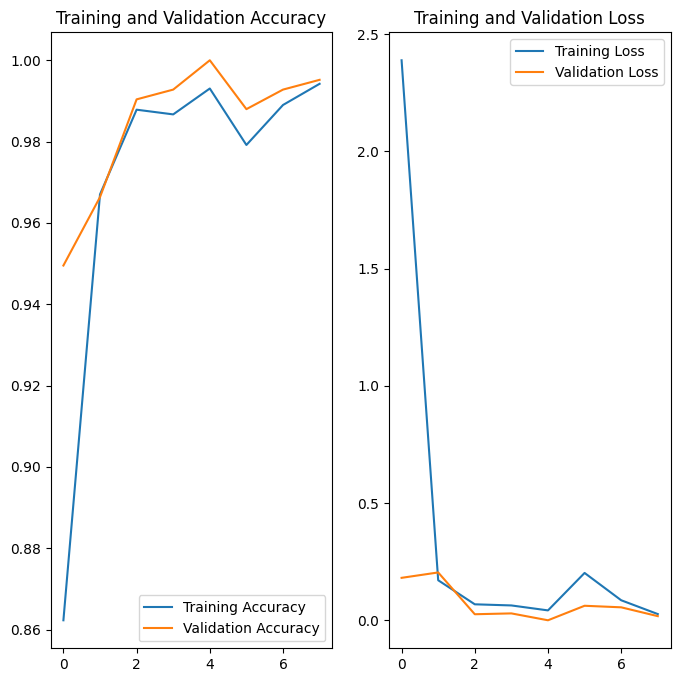

In [ ]:
EPOCHS=8
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


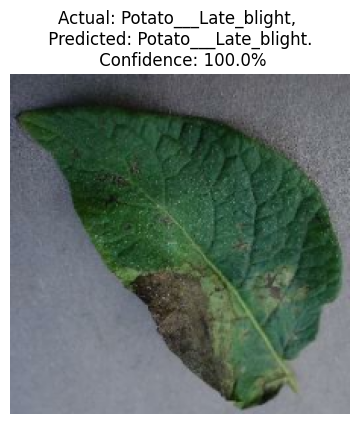

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(resnet50_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# ResNet152 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet152

# Assuming you have defined IMAGE_SIZE, BATCH_SIZE, and CHANNELS previously

# Load the pre-trained ResNet152 model
resnet152_model = ResNet152(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in resnet152_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(resnet152_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(flatten_layer)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the ResNet152 base model with your custom head
resnet152_custom_model = models.Model(inputs=resnet152_model.input, outputs=output_layer)

# Summary of the model
resnet152_custom_model.summary()

Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_34      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_34[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 84,062,083 (320.67 MB)

 Trainable params: 25,691,139 (98.00 MB)

 Non-trainable params: 58,370,944 (222.67 MB)

In [ ]:
# Compile the model
resnet152_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

history_resnet152 = resnet152_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 55s 474ms/step - accuracy: 0.7723 - loss: 17.9941 - val_accuracy: 0.9159 - val_loss: 0.5983
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 16s 295ms/step - accuracy: 0.9294 - loss: 0.5485 - val_accuracy: 0.9952 - val_loss: 0.0063
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 16s 294ms/step - accuracy: 0.9937 - loss: 0.0605 - val_accuracy: 0.9976 - val_loss: 0.0088
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 280ms/step - accuracy: 0.9952 - loss: 0.0166 - val_accuracy: 0.9976 - val_loss: 0.0137
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 277ms/step - accuracy: 0.9991 - loss: 0.0033 - val_accuracy: 1.0000 - val_loss: 5.6547e-04
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 279ms/step - accuracy: 0.9983 - loss: 0.0113 - val_accuracy: 0.9952 - val_loss: 0.0073
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 282ms/step - accuracy: 0.9997 - loss: 5.2713e-04 - val_accuracy: 0.9976 - val_loss: 0.0166
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 285ms/step - accuracy: 1.0000 - loss: 5.2002e-

In [ ]:
scores_resnet152=resnet152_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step - accuracy: 0.9978 - loss: 0.0067


In [ ]:
scores_resnet152

[0.007289527915418148, 0.9975961446762085]

In [ ]:
acc = history_resnet152.history['accuracy']
val_acc = history_resnet152.history['val_accuracy']
loss = history_resnet152.history['loss']
val_loss = history_resnet152.history['val_loss']

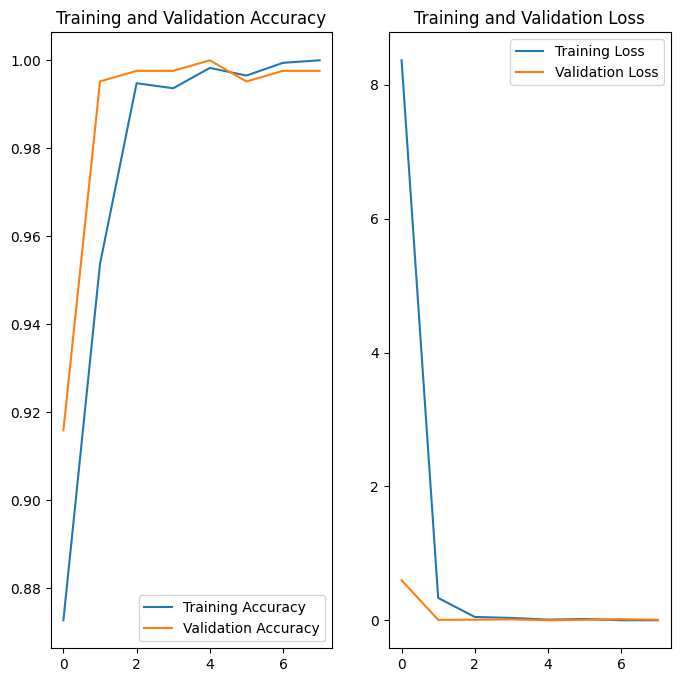

In [ ]:
EPOCHS=8
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step


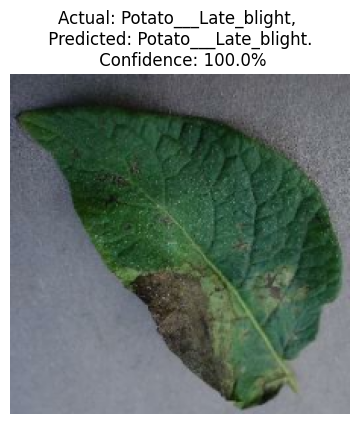

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(resnet152_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# InceptionV3 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import InceptionV3

# Load the pre-trained InceptionV3 model without the top classification layer
inceptionv3_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in inceptionv3_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(inceptionv3_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(256, activation='relu')(dense_layer_1)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the InceptionV3 base model with your custom head
inceptionv3_custom_model = models.Model(inputs=inceptionv3_model.input, outputs=output_layer)

# Summary of the InceptionV3 model
inceptionv3_custom_model.summary()

Model: "functional_37"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_305 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_26[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 111, 111,  │         96 │ conv2d_305[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_282      │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_306 (Conv2D) │ (None, 109, 109,  │      9,216 │ activation_282[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_306[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_283      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_307 (Conv2D) │ (None, 109, 109,  │     18,432 │ activation_283[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_307[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_284      │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_47    │ (None, 54, 54,    │          0 │ activation_284[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_308 (Conv2D) │ (None, 54, 54,    │      5,120 │ max_pooling2d_47… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_308[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_285      │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_309 (Conv2D) │ (None, 52, 52,    │    138,240 │ activation_285[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_309[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_286      │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 28,390,307 (108.30 MB)

 Trainable params: 6,587,523 (25.13 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

In [ ]:
# Compile the model
inceptionv3_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the InceptionV3 model
history_inceptionv3 = inceptionv3_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - accuracy: 0.5422 - loss: 70.6454 - val_accuracy: 0.8245 - val_loss: 12.9733
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - accuracy: 0.7201 - loss: 8.1867 - val_accuracy: 0.8005 - val_loss: 2.8155
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 80ms/step - accuracy: 0.8239 - loss: 2.5835 - val_accuracy: 0.8774 - val_loss: 0.8399
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.8669 - loss: 1.0144 - val_accuracy: 0.8534 - val_loss: 1.2537
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.8810 - loss: 0.7882 - val_accuracy: 0.8630 - val_loss: 0.9292
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.8432 - loss: 1.2317 - val_accuracy: 0.9135 - val_loss: 0.6717
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.8865 - loss: 0.8212 - val_accuracy: 0.7524 - val_loss: 2.2338
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.8500 - loss: 1.7465 - val_accuracy: 0.9038

In [ ]:
scores=inceptionv3_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - accuracy: 0.9481 - loss: 0.3364


In [ ]:
scores

[0.34623411297798157, 0.9567307829856873]

In [ ]:
history_inceptionv3.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_inceptionv3.history['accuracy']
val_acc=history_inceptionv3.history['val_accuracy']

loss=history_inceptionv3.history['loss']
val_loss=history_inceptionv3.history['val_loss']

In [ ]:
history_inceptionv3.history['accuracy']

[0.6452546119689941,
 0.7361111044883728,
 0.8356481194496155,
 0.8611111044883728,
 0.8778935074806213,
 0.8530092835426331,
 0.8848379850387573,
 0.8796296119689941,
 0.9045138955116272,
 0.8836805820465088,
 0.9074074029922485,
 0.8946759104728699,
 0.9542824029922485,
 0.9525462985038757]

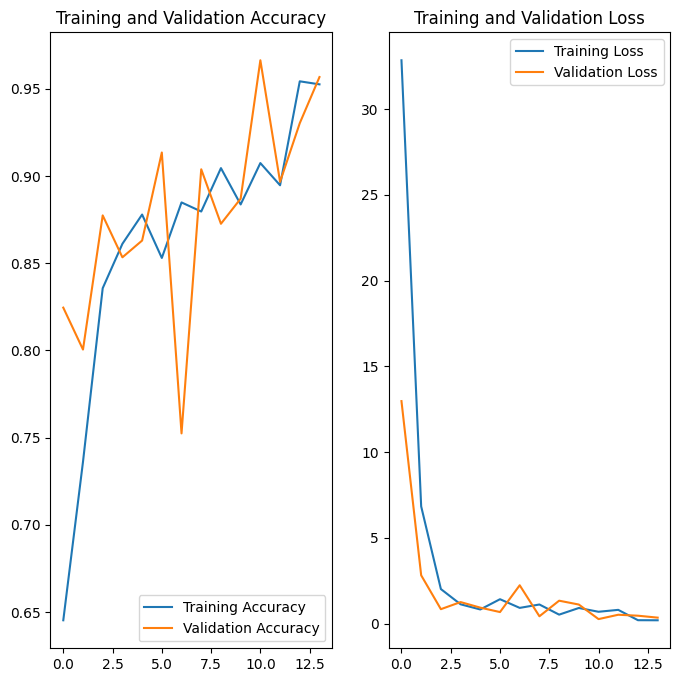

In [ ]:
EPOCHS=14
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


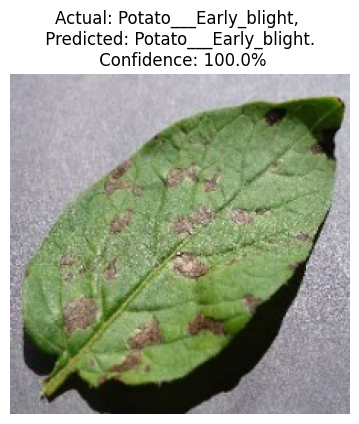

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(inceptionv3_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# VGG16 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16

# Load the pre-trained VGG16 model without the top classification layer
vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in vgg16_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(vgg16_model.output)
#dense_layer_1 = layers.Dense(64, activation='relu')(flatten_layer)
dense_layer_2 = layers.Dense(128, activation='relu')(flatten_layer)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_2)

# Combine the VGG16 base model with your custom head
vgg16_custom_model_1 = models.Model(inputs=vgg16_model.input, outputs=output_layer)

# Summary of the VGG16 model
vgg16_custom_model_1.summary()

Model: "functional_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_38 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_29 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,926,467 (68.38 MB)

 Trainable params: 3,211,779 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
# Compile the model
vgg16_custom_model_1.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the ResNet model with early stopping
history_vgg16_custom_model_1 = vgg16_custom_model_1.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)


Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - accuracy: 0.7162 - loss: 22.1857 - val_accuracy: 0.9303 - val_loss: 0.3083
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 170ms/step - accuracy: 0.9415 - loss: 0.2003 - val_accuracy: 0.9712 - val_loss: 0.0800
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - accuracy: 0.9866 - loss: 0.0431 - val_accuracy: 0.9784 - val_loss: 0.0487
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.9986 - loss: 0.0098 - val_accuracy: 0.9928 - val_loss: 0.0391
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9997 - loss: 0.0038 - val_accuracy: 0.9928 - val_loss: 0.0324
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 169ms/step - accuracy: 0.9992 - loss: 0.0050 - val_accuracy: 0.9928 - val_loss: 0.0313
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - accuracy: 1.0000 - loss: 0.0011 - val_accuracy: 0.9928 - val_loss: 0.0331
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - accuracy: 1.0000 - loss: 8.6773e-04 - val_accur

In [ ]:
scores=vgg16_custom_model_1.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 134ms/step - accuracy: 0.9984 - loss: 0.0108


In [ ]:
scores

[0.03536389023065567, 0.9927884340286255]

In [ ]:
history_vgg16_custom_model_1.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_vgg16_custom_model_1.history['accuracy']
val_acc=history_vgg16_custom_model_1.history['val_accuracy']

loss=history_vgg16_custom_model_1.history['loss']
val_loss=history_vgg16_custom_model_1.history['val_loss']


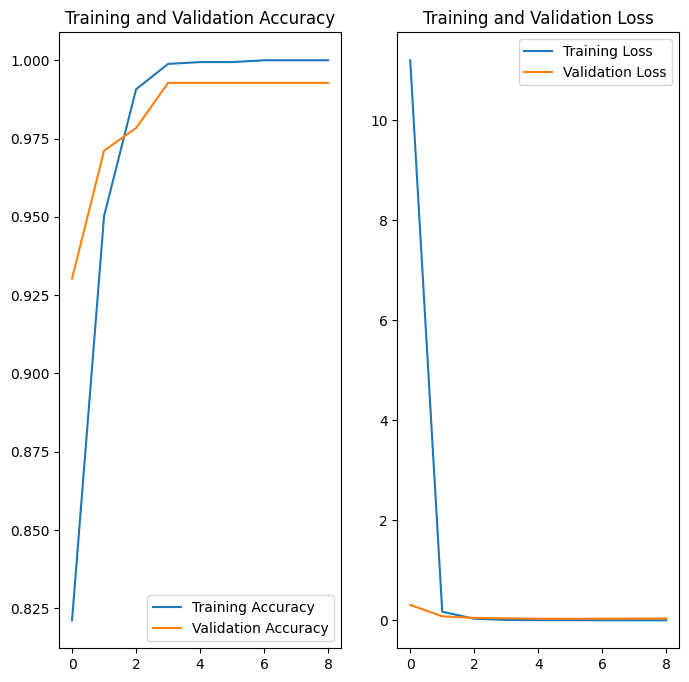

In [ ]:
EPOCHS=9
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


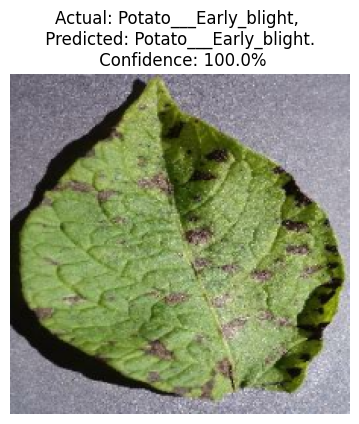

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(vgg16_custom_model_1, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# VGG19 Model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG19

# Load the pre-trained VGG19 model without the top classification layer
vgg19_model = VGG19(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# Freeze the weights of the pre-trained layers
for layer in vgg19_model.layers:
    layer.trainable = False

# Define your custom head for classification
flatten_layer = layers.Flatten()(vgg19_model.output)
dense_layer_1 = layers.Dense(128, activation='relu')(flatten_layer)
output_layer = layers.Dense(3, activation='softmax')(dense_layer_1)

# Combine the VGG19 base model with your custom head
vgg19_custom_model = models.Model(inputs=vgg19_model.input, outputs=output_layer)

# Summary of the VGG19 model
vgg19_custom_model.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_39 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_30 (Flatten)            │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 3)              │           38

 Total params: 23,236,163 (88.64 MB)

 Trainable params: 3,211,779 (12.25 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
# Compile the model
vgg19_custom_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Define the early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=3)

# Train the VGG19 model with early stopping
history_vgg19 = vgg19_custom_model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
    callbacks=[early_stopping]
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 14s 216ms/step - accuracy: 0.6924 - loss: 23.9600 - val_accuracy: 0.8942 - val_loss: 0.3262
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.9562 - loss: 0.1318 - val_accuracy: 0.9808 - val_loss: 0.0671
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 211ms/step - accuracy: 0.9897 - loss: 0.0350 - val_accuracy: 0.9904 - val_loss: 0.0446
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 207ms/step - accuracy: 0.9960 - loss: 0.0190 - val_accuracy: 0.9856 - val_loss: 0.0469
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 202ms/step - accuracy: 0.9978 - loss: 0.0090 - val_accuracy: 0.9856 - val_loss: 0.0382
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - accuracy: 0.9990 - loss: 0.0045 - val_accuracy: 0.9880 - val_loss: 0.0362
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - accuracy: 0.9993 - loss: 0.0027 - val_accuracy: 0.9928 - val_loss: 0.0347
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 11s 201ms/step - accuracy: 0.9991 - loss: 0.0021 - val_acc

In [ ]:
scores=vgg19_custom_model.evaluate(val_ds)

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - accuracy: 0.9941 - loss: 0.0152


In [ ]:
history_vgg19.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
acc=history_vgg19.history['accuracy']
val_acc=history_vgg19.history['val_accuracy']

loss=history_vgg19.history['loss']
val_loss=history_vgg19.history['val_loss']

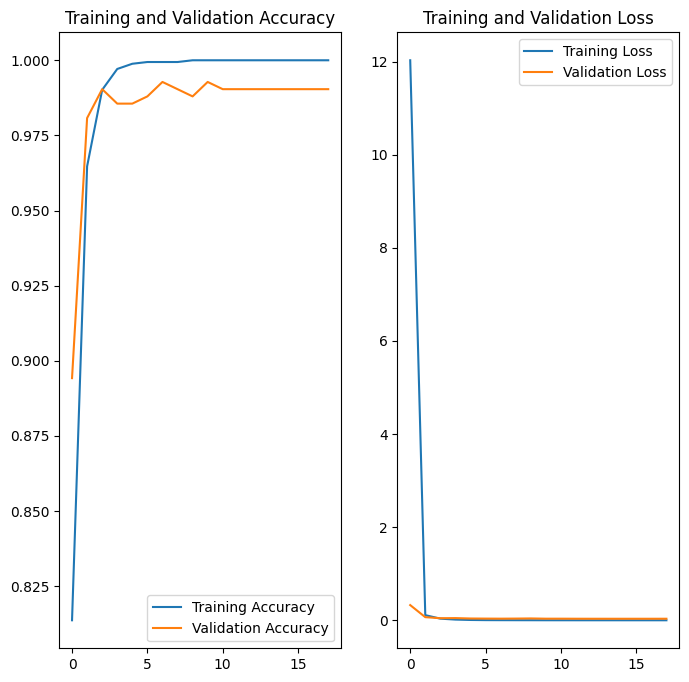

In [ ]:
EPOCHS=18
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def predict(model, img):
  img_array=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
  img_array=tf.expand_dims(img_array,0) #create a batch

  predictions=model.predict(img_array)

  predicted_class=class_names[np.argmax(predictions[0])]
  confidence=round(100*(np.max(predictions[0])),2)
  return predicted_class, confidence


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 740ms/step


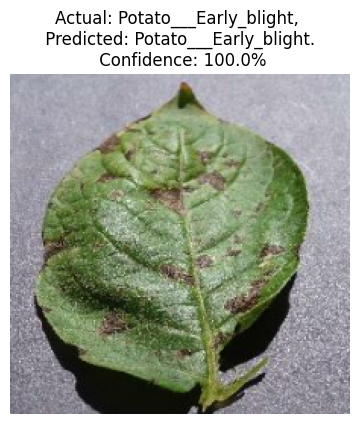

In [ ]:
plt.figure(figsize=(15,15))
for images, labels in val_ds.take(1):
  for i in range(1):
    ax=plt.subplot(3,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    predicted_class, confidence=predict(vgg19_custom_model, images[i].numpy())

    actual_class=class_names[labels[i]]
    plt.title(f"Actual: {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}%")
    plt.axis("off")

# Comparing Accuracy of Pre Trained Models with Our Own CNN Model:
## ResNet50 Model: 99.46%
## ResNet152 Model: 99.78%
## InceptionV3 Model: 94.81%
## VGG16 Model: 99.84%
## VGG19 Model: 99.41%